Name: Anushree Patil

Github Username: Anushreepa

USC ID: 8671674031

## 1. Decision Trees as Interpretable Models

Import packages

In [94]:
import pandas as pd
from sklearn import preprocessing
from sklearn import tree
import matplotlib.pyplot as plt
from sklearn.tree import DecisionTreeClassifier
from sklearn.model_selection import GridSearchCV
from sklearn import tree
import numpy as np
import seaborn as sns
import math
import statsmodels.api as sm
import statsmodels.formula.api as smf
from sklearn.metrics import *
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.linear_model import RidgeCV
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LinearRegression
from sklearn.pipeline import Pipeline
import xgboost as xgb
import warnings
warnings.filterwarnings('ignore')

### (a) Obtain Data

Get the Accute Inamations Data Set

In [95]:
diag_data = pd.read_fwf("../data/diagnosis.data",header=None,encoding = 'utf16')
diag_data.columns = ['temp','data']
diag_data=pd.concat([diag_data['temp'],diag_data['data'].str.split('\t',expand=True)],axis=1)
diag_data.rename(columns={0:'nausea',1:'lumbar',2:'urine',3:'pains',4:'burning',5:'inflammation',6:'nephritis'},inplace=True)
diag_data['temp']=diag_data['temp'].str.replace(',','.')

### (b) Build a decision tree

[Text(0.4, 0.9, 'X[2] <= 0.5\ngini = 0.735\nsamples = 120\nvalue = [30, 31, 40, 19]'),
 Text(0.2, 0.7, 'X[0] <= 38.95\ngini = 0.32\nsamples = 50\nvalue = [10, 0, 40, 0]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [0, 0, 40, 0]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [10, 0, 0, 0]'),
 Text(0.6, 0.7, 'X[0] <= 37.95\ngini = 0.649\nsamples = 70\nvalue = [20, 31, 0, 19]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [20, 0, 0, 0]'),
 Text(0.7, 0.5, 'X[4] <= 0.5\ngini = 0.471\nsamples = 50\nvalue = [0, 31, 0, 19]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [0, 21, 0, 0]'),
 Text(0.8, 0.3, 'X[3] <= 0.5\ngini = 0.452\nsamples = 29\nvalue = [0, 10, 0, 19]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [0, 10, 0, 0]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [0, 0, 0, 19]')]

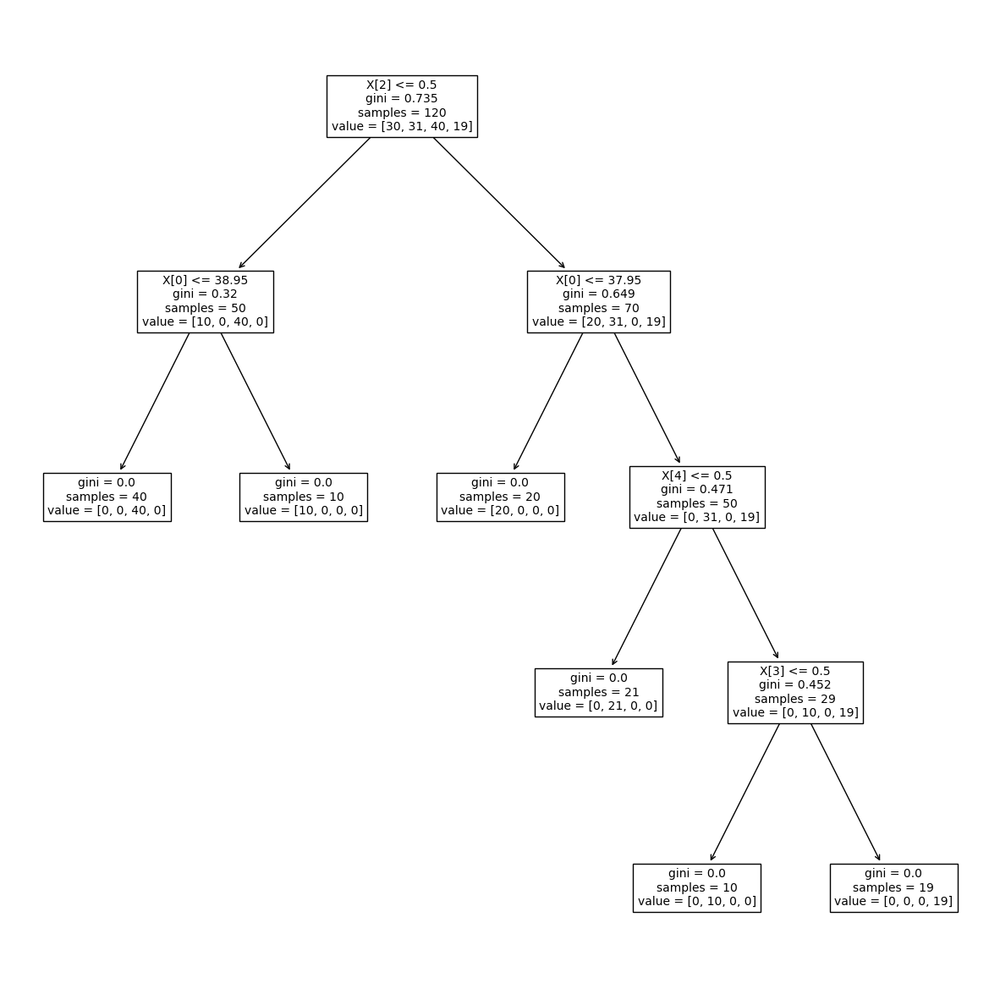

In [96]:
le = preprocessing.LabelEncoder()
diag_data_multiclass = diag_data.copy()
diag_data_multiclass['class']=le.fit_transform(diag_data_multiclass['inflammation'][:]+diag_data_multiclass['nephritis'][:])
diag_data_multiclass.drop('inflammation',inplace=True,axis=1)
diag_data_multiclass.drop('nephritis',inplace=True,axis=1)
diag_data_multiclass['nausea']=diag_data_multiclass['nausea'].map({'yes': 1, 'no': 0})
diag_data_multiclass['lumbar']=diag_data_multiclass['lumbar'].map({'yes': 1, 'no': 0})
diag_data_multiclass['urine']=diag_data_multiclass['urine'].map({'yes': 1, 'no': 0})
diag_data_multiclass['pains']=diag_data_multiclass['pains'].map({'yes': 1, 'no': 0})
diag_data_multiclass['burning']=diag_data_multiclass['burning'].map({'yes': 1, 'no': 0})
le.inverse_transform([0,1,2,3])
clf = tree.DecisionTreeClassifier(random_state=0)
clf = clf.fit(diag_data_multiclass.iloc[:,:-1], diag_data_multiclass['class'])
plt.figure(figsize=(15,15))
tree.plot_tree(clf,fontsize=10)

### (c) Convert the decision rules

In [97]:
def tree_to_code(tree, feature_names):
    left = tree.tree_.children_left
    right = tree.tree_.children_right
    threshold = tree.tree_.threshold
    features = [feature_names[i] for i in tree.tree_.feature]
    value = tree.tree_.value

    def recurse(left, right, threshold, features, node, depth=0):
        indent = "  " * depth
        if (threshold[node] != -2):
            print(indent,"if ( " + features[node] + " <= " + str(threshold[node]) + " ) {")
            if left[node] != -1:
                recurse (left, right, threshold, features, left[node], depth+1)
                print(indent,"} else {")
                if right[node] != -1:
                    recurse (left, right, threshold, features, right[node], depth+1)
                print(indent,"}")
        else:
            print(indent,"return " + str(value[node]))

    recurse(left, right, threshold, features, 0)
tree_to_code(clf, list(diag_data_multiclass.columns))

 if ( lumbar <= 0.5 ) {
   if ( temp <= 38.95000076293945 ) {
     return [[ 0.  0. 40.  0.]]
   } else {
     return [[10.  0.  0.  0.]]
   }
 } else {
   if ( temp <= 37.95000076293945 ) {
     return [[20.  0.  0.  0.]]
   } else {
     if ( pains <= 0.5 ) {
       return [[ 0. 21.  0.  0.]]
     } else {
       if ( urine <= 0.5 ) {
         return [[ 0. 10.  0.  0.]]
       } else {
         return [[ 0.  0.  0. 19.]]
       }
     }
   }
 }


### (d) Cost-complexity Pruning

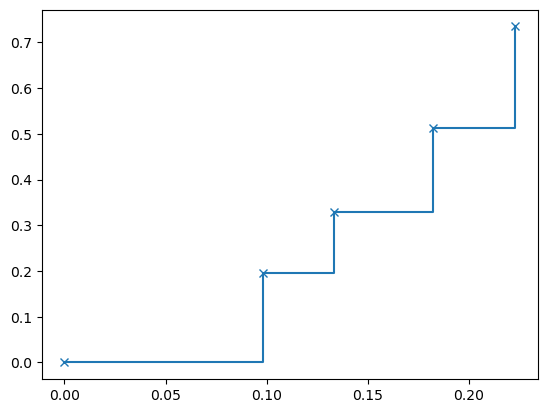

In [98]:
path = clf.cost_complexity_pruning_path(diag_data_multiclass.iloc[:,:-1], diag_data_multiclass['class'])
ccp_alphas, impurities = path.ccp_alphas, path.impurities
fig, ax = plt.subplots()
ax.plot(ccp_alphas, impurities, marker="x", drawstyle="steps-post")

In [99]:
ccp_alphas

array([0.        , 0.09816667, 0.13333333, 0.182     , 0.22291667])

In [100]:
clfs = []
for ccp_alpha in ccp_alphas:
    temp_clf = DecisionTreeClassifier(random_state=0, ccp_alpha=ccp_alpha)
    temp_clf.fit(diag_data_multiclass.iloc[:,:-1], diag_data_multiclass['class'])
    clfs.append(temp_clf)
    print(
        "Number of nodes in the current tree is: {} with ccp_alpha: {}".format(
            temp_clf.tree_.node_count, ccp_alpha
        )
    )

Number of nodes in the current tree is: 11 with ccp_alpha: 0.0
Number of nodes in the current tree is: 7 with ccp_alpha: 0.09816666666666667
Number of nodes in the current tree is: 5 with ccp_alpha: 0.13333333333333333
Number of nodes in the current tree is: 3 with ccp_alpha: 0.18199999999999997
Number of nodes in the current tree is: 1 with ccp_alpha: 0.22291666666666676


In [101]:
tree = DecisionTreeClassifier(random_state=0)
parameters = {'ccp_alpha':ccp_alphas}
grid_clf = GridSearchCV(tree, parameters)
grid_clf.fit(diag_data_multiclass.iloc[:,:-1], diag_data_multiclass['class'])
print("test_scores", grid_clf.cv_results_['mean_test_score'])
print("rank test scores", grid_clf.cv_results_['rank_test_score'])
print("parameter - ccp_alpha", grid_clf.cv_results_['param_ccp_alpha'])

test_scores [0.95833333 0.775      0.71666667 0.6        0.43333333]
rank test scores [1 2 3 4 5]
parameter - ccp_alpha [0.0 0.09816666666666667 0.13333333333333333 0.18199999999999997
 0.22291666666666676]


As can be seen, best alpha is 0.

[Text(0.4, 0.9, 'X[2] <= 0.5\ngini = 0.735\nsamples = 120\nvalue = [30, 31, 40, 19]'),
 Text(0.2, 0.7, 'X[0] <= 38.95\ngini = 0.32\nsamples = 50\nvalue = [10, 0, 40, 0]'),
 Text(0.1, 0.5, 'gini = 0.0\nsamples = 40\nvalue = [0, 0, 40, 0]'),
 Text(0.3, 0.5, 'gini = 0.0\nsamples = 10\nvalue = [10, 0, 0, 0]'),
 Text(0.6, 0.7, 'X[0] <= 37.95\ngini = 0.649\nsamples = 70\nvalue = [20, 31, 0, 19]'),
 Text(0.5, 0.5, 'gini = 0.0\nsamples = 20\nvalue = [20, 0, 0, 0]'),
 Text(0.7, 0.5, 'X[4] <= 0.5\ngini = 0.471\nsamples = 50\nvalue = [0, 31, 0, 19]'),
 Text(0.6, 0.3, 'gini = 0.0\nsamples = 21\nvalue = [0, 21, 0, 0]'),
 Text(0.8, 0.3, 'X[3] <= 0.5\ngini = 0.452\nsamples = 29\nvalue = [0, 10, 0, 19]'),
 Text(0.7, 0.1, 'gini = 0.0\nsamples = 10\nvalue = [0, 10, 0, 0]'),
 Text(0.9, 0.1, 'gini = 0.0\nsamples = 19\nvalue = [0, 0, 0, 19]')]

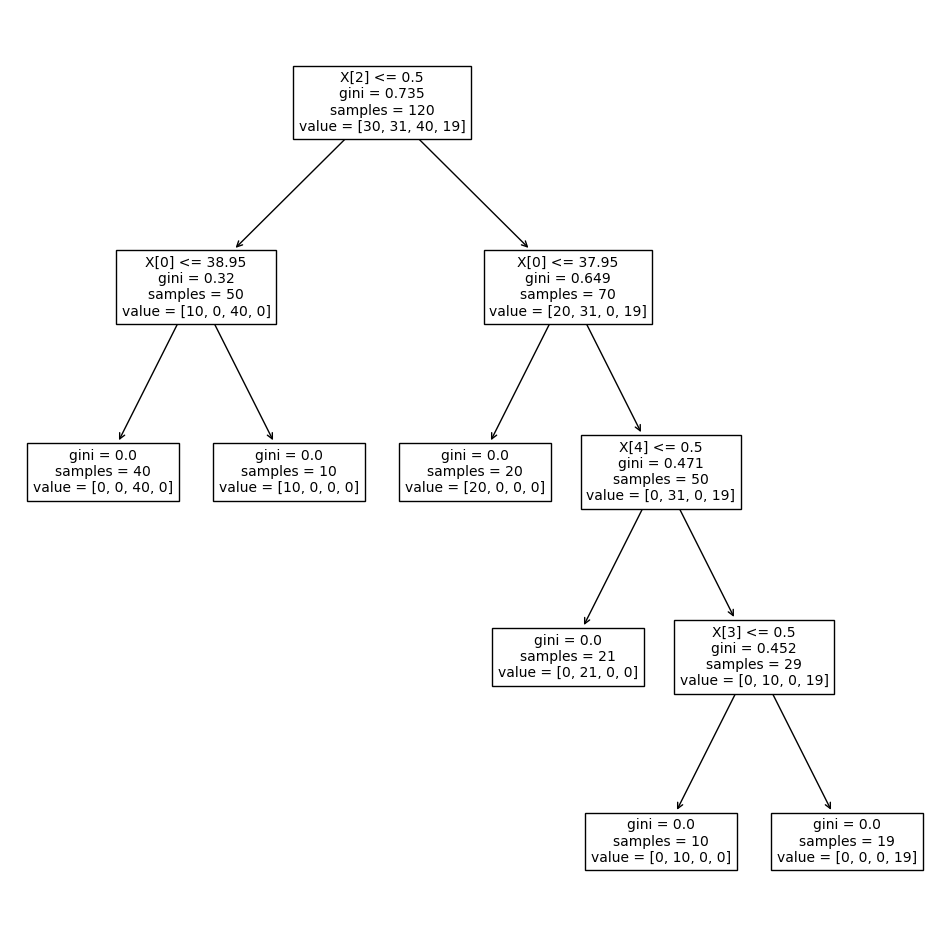

In [102]:
from sklearn import tree
best_clf = tree.DecisionTreeClassifier(random_state=0, ccp_alpha = 0)
best_clf = best_clf.fit(diag_data_multiclass.iloc[:,:-1], diag_data_multiclass['class'])
plt.figure(figsize=(12,12))
tree.plot_tree(best_clf,fontsize=10)

In [103]:
tree_to_code(best_clf, list(diag_data_multiclass.columns))

 if ( lumbar <= 0.5 ) {
   if ( temp <= 38.95000076293945 ) {
     return [[ 0.  0. 40.  0.]]
   } else {
     return [[10.  0.  0.  0.]]
   }
 } else {
   if ( temp <= 37.95000076293945 ) {
     return [[20.  0.  0.  0.]]
   } else {
     if ( pains <= 0.5 ) {
       return [[ 0. 21.  0.  0.]]
     } else {
       if ( urine <= 0.5 ) {
         return [[ 0. 10.  0.  0.]]
       } else {
         return [[ 0.  0.  0. 19.]]
       }
     }
   }
 }


## 2. The LASSO and Boosting for Regression

### (a) Obtain Data

In [104]:
import pandas as pd
columns = ['state',
 'county' ,
 'community', 
 'communityname' ,
 'fold' ,
 'population' ,
 'householdsize' ,
 'racepctblack' ,
 'racePctWhite' ,
 'racePctAsian' ,
 'racePctHisp' ,
 'agePct12t21' ,
 'agePct12t29' ,
 'agePct16t24' ,
 'agePct65up' ,
 'numbUrban' ,
 'pctUrban' ,
 'medIncome' ,
 'pctWWage' ,
 'pctWFarmSelf' ,
 'pctWInvInc' ,
 'pctWSocSec' ,
 'pctWPubAsst' ,
 'pctWRetire' ,
 'medFamInc' ,
 'perCapInc' ,
 'whitePerCap' ,
 'blackPerCap' ,
 'indianPerCap' ,
 'AsianPerCap' ,
 'OtherPerCap' ,
 'HispPerCap' ,
 'NumUnderPov' ,
 'PctPopUnderPov' ,
 'PctLess9thGrade' ,
 'PctNotHSGrad' ,
 'PctBSorMore' ,
 'PctUnemployed' ,
 'PctEmploy' ,
 'PctEmplManu' ,
 'PctEmplProfServ' ,
 'PctOccupManu' ,
 'PctOccupMgmtProf' ,
 'MalePctDivorce' ,
 'MalePctNevMarr' ,
 'FemalePctDiv' ,
 'TotalPctDiv' ,
 'PersPerFam' ,
 'PctFam2Par' ,
 'PctKids2Par' ,
 'PctYoungKids2Par' ,
 'PctTeen2Par' ,
 'PctWorkMomYoungKids' ,
 'PctWorkMom' ,
 'NumIlleg' ,
 'PctIlleg' ,
 'NumImmig' ,
 'PctImmigRecent' ,
 'PctImmigRec5' ,
 'PctImmigRec8' ,
 'PctImmigRec10' ,
 'PctRecentImmig' ,
 'PctRecImmig5' ,
 'PctRecImmig8' ,
 'PctRecImmig10' ,
 'PctSpeakEnglOnly' ,
 'PctNotSpeakEnglWell' ,
 'PctLargHouseFam' ,
 'PctLargHouseOccup' ,
 'PersPerOccupHous' ,
 'PersPerOwnOccHous' ,
 'PersPerRentOccHous' ,
 'PctPersOwnOccup' ,
 'PctPersDenseHous' ,
 'PctHousLess3BR' ,
 'MedNumBR' ,
 'HousVacant' ,
 'PctHousOccup' ,
 'PctHousOwnOcc' ,
 'PctVacantBoarded' ,
 'PctVacMore6Mos' ,
 'MedYrHousBuilt' ,
 'PctHousNoPhone' ,
 'PctWOFullPlumb' ,
 'OwnOccLowQuart' ,
 'OwnOccMedVal' ,
 'OwnOccHiQuart' ,
 'RentLowQ' ,
 'RentMedian' ,
 'RentHighQ' ,
 'MedRent' ,
 'MedRentPctHousInc' ,
 'MedOwnCostPctInc' ,
 'MedOwnCostPctIncNoMtg' ,
 'NumInShelters' ,
 'NumStreet' ,
 'PctForeignBorn' ,
 'PctBornSameState' ,
 'PctSameHouse85' ,
 'PctSameCity85' ,
 'PctSameState85' ,
 'LemasSwornFT' ,
 'LemasSwFTPerPop' ,
 'LemasSwFTFieldOps' ,
 'LemasSwFTFieldPerPop' ,
 'LemasTotalReq' ,
 'LemasTotReqPerPop' ,
 'PolicReqPerOffic' ,
 'PolicPerPop' ,
 'RacialMatchCommPol' ,
 'PctPolicWhite' ,
 'PctPolicBlack' ,
 'PctPolicHisp' ,
 'PctPolicAsian' ,
 'PctPolicMinor' ,
 'OfficAssgnDrugUnits' ,
 'NumKindsDrugsSeiz' ,
 'PolicAveOTWorked' ,
 'LandArea' ,
 'PopDens' ,
 'PctUsePubTrans' ,
 'PolicCars' ,
 'PolicOperBudg' ,
 'LemasPctPolicOnPatr' ,
 'LemasGangUnitDeploy' ,
 'LemasPctOfficDrugUn' ,
 'PolicBudgPerPop' ,
 'ViolentCrimesPerPop']

communities_data = pd.read_fwf("../data/communities.data",header=None)
communities_data=communities_data[0].str.split(',',expand=True)
communities_data=communities_data.rename(dict(enumerate(columns)),axis=1)

In [105]:
communities_data

,state,county,community,communityname,fold,population,householdsize,racepctblack,racePctWhite,racePctAsian,...,LandArea,PopDens,PctUsePubTrans,PolicCars,PolicOperBudg,LemasPctPolicOnPatr,LemasGangUnitDeploy,LemasPctOfficDrugUn,PolicBudgPerPop,ViolentCrimesPerPop
0,8,?,?,Lakewoodcity,1,0.19,0.33,0.02,0.9,0.12,...,0.12,0.26,0.2,0.06,0.04,0.9,0.5,0.32,0.14,0.2
1,53,?,?,Tukwilacity,1,0,0.16,0.12,0.74,0.45,...,0.02,0.12,0.45,?,?,?,?,0,?,0.67
2,24,?,?,Aberdeentown,1,0,0.42,0.49,0.56,0.17,...,0.01,0.21,0.02,?,?,?,?,0,?,0.43
3,34,5,81440,Willingborotownship,1,0.04,0.77,1,0.08,0.12,...,0.02,0.39,0.28,?,?,?,?,0,?,0.12
4,42,95,6096,Bethlehemtownship,1,0.01,0.55,0.02,0.95,0.09,...,0.04,0.09,0.02,?,?,?,?,0,?,0.03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1989,12,?,?,TempleTerracecity,10,0.01,0.4,0.1,0.87,0.12,...,0.01,0.28,0.05,?,?,?,?,0,?,0.09
1990,6,?,?,Seasidecity,10,0.05,0.96,0.46,0.28,0.83,...,0.02,0.37,0.2,?,?,?,?,0,?,0.45
1991,9,9,80070,Waterburytown,10,0.16,0.37,0.25,0.69,0.04,...,0.08,0.32,0.18,0.08,0.06,0.78,0,0.91,0.28,0.23
1992,25,17,72600,Walthamcity,10,0.08,0.51,0.06,0.87,0.22,...,0.03,0.38,0.33,0.02,0.02,0.79,0,0.22,0.18,0.19


In [106]:
communities_data_train = communities_data.iloc[:1495,:].copy()
communities_data_test = communities_data.iloc[1495:,:].copy()
communities_data_test.reset_index(drop=True,inplace=True)

### (b) Missing values

In [107]:
communities_data_train.replace('?',np.nan,inplace=True)
communities_data_test.replace('?',np.nan, inplace=True)
communities_data_train = communities_data_train.fillna(value=np.nan)
communities_data_test = communities_data_test.fillna(value=np.nan)
communities_data_train.replace('',np.nan,inplace=True)
communities_data_test.replace('',np.nan, inplace=True)

In [108]:
communities_data_train.drop(['state','county','community','communityname','fold'],axis=1,inplace=True)
communities_data_test.drop(['state','county','community','communityname','fold'],axis=1,inplace=True)

In [109]:
missing_val_cols_train = communities_data_train.columns[communities_data_train.isnull().any()].tolist()
missing_val_cols_test = communities_data_test.columns[communities_data_test.isnull().any()].tolist()

In [110]:
for i in missing_val_cols_train:
    communities_data_train[i].fillna(communities_data_train[i].astype(str).astype(float).mean(), inplace = True)
    
for i in missing_val_cols_test:
    communities_data_test[i].fillna(communities_data_test[i].astype(str).astype(float).mean(), inplace = True)

In [111]:
for i in communities_data_train.columns:
    communities_data_train[i]=pd.to_numeric(communities_data_train[i])
    communities_data_test[i]=pd.to_numeric(communities_data_test[i])

In [112]:
communities_data = pd.concat([communities_data_train,communities_data_test],axis=0,ignore_index=True)

In [113]:
communities_data.columns[communities_data.isnull().any()].tolist()

[]

Used this method for imputation as it gave the best results on trial and error.

### (c) Plot a correlation matrix

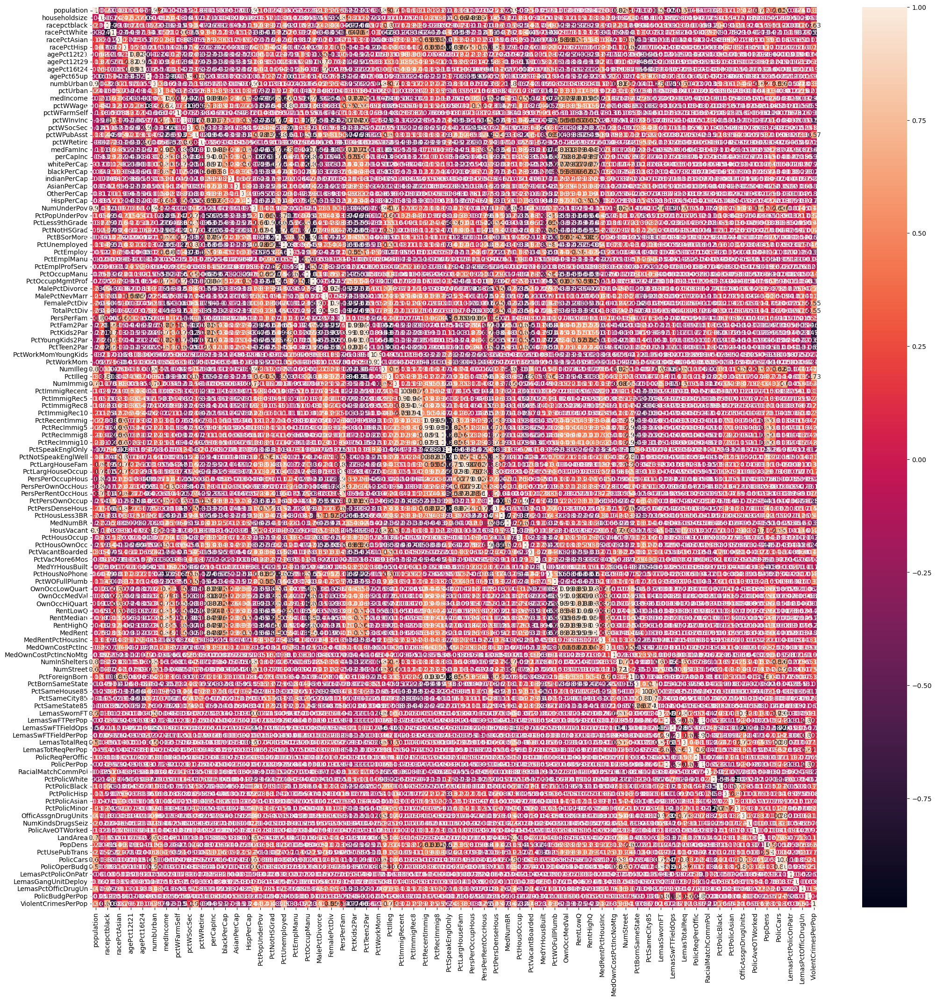

In [114]:
plt.figure(figsize=(25,25))
sns.heatmap(communities_data.corr(),annot=True)
plt.show()

In [115]:
corr = communities_data.corr()
corr.style.background_gradient(cmap='coolwarm')

### (d) Calculate the Coefficient of Variation CV

In [116]:
cv =  lambda x: np.std(x) / np.mean(x)
coeff_var = np.apply_along_axis(cv, axis=0, arr=communities_data.to_numpy())
coeff_var_pd = pd.DataFrame()
coeff_var_pd['col']=communities_data.columns
coeff_var_pd['coeff_var']=coeff_var
coeff_var_pd

,col,coeff_var
0,population,2.202950
1,householdsize,0.353210
2,racepctblack,1.410567
3,racePctWhite,0.323700
4,racePctAsian,1.358821
...,...,...
118,LemasPctPolicOnPatr,0.126610
119,LemasGangUnitDeploy,0.370219
120,LemasPctOfficDrugUn,2.554625
121,PolicBudgPerPop,0.338567


### (e) Scatter plots and box plots for highest CV features

In [117]:
coeff_var_pd=coeff_var_pd.sort_values('coeff_var',ascending=False)
count = math.floor(math.sqrt(128))
top_cols=coeff_var_pd.iloc[:count,:]
top_cols

,col,coeff_var
90,NumStreet,4.406597
89,NumInShelters,3.484607
49,NumIlleg,2.993446
51,NumImmig,2.899770
120,LemasPctOfficDrugUn,2.554625
27,NumUnderPov,2.304392
0,population,2.202950
10,numbUrban,2.001242
71,HousVacant,1.958288
113,LandArea,1.677611


In [118]:
top_cols = top_cols['col'].to_list()
top_cols_communities_data = communities_data[top_cols]
top_cols_communities_data

,NumStreet,NumInShelters,NumIlleg,NumImmig,LemasPctOfficDrugUn,NumUnderPov,population,numbUrban,HousVacant,LandArea,racePctHisp
0,0.00,0.04,0.04,0.03,0.32,0.08,0.19,0.20,0.21,0.12,0.17
1,0.00,0.00,0.00,0.01,0.00,0.01,0.00,0.02,0.02,0.02,0.07
2,0.00,0.00,0.01,0.00,0.00,0.01,0.00,0.00,0.01,0.01,0.04
3,0.00,0.00,0.03,0.02,0.00,0.01,0.04,0.06,0.01,0.02,0.10
4,0.00,0.00,0.00,0.00,0.00,0.00,0.01,0.02,0.01,0.04,0.05
...,...,...,...,...,...,...,...,...,...,...,...
1989,0.00,0.00,0.00,0.01,0.00,0.01,0.01,0.03,0.02,0.01,0.16
1990,0.00,0.01,0.03,0.05,0.00,0.04,0.05,0.06,0.03,0.02,0.32
1991,0.02,0.06,0.13,0.06,0.91,0.12,0.16,0.17,0.21,0.08,0.25
1992,0.01,0.04,0.02,0.06,0.22,0.03,0.08,0.09,0.05,0.03,0.10


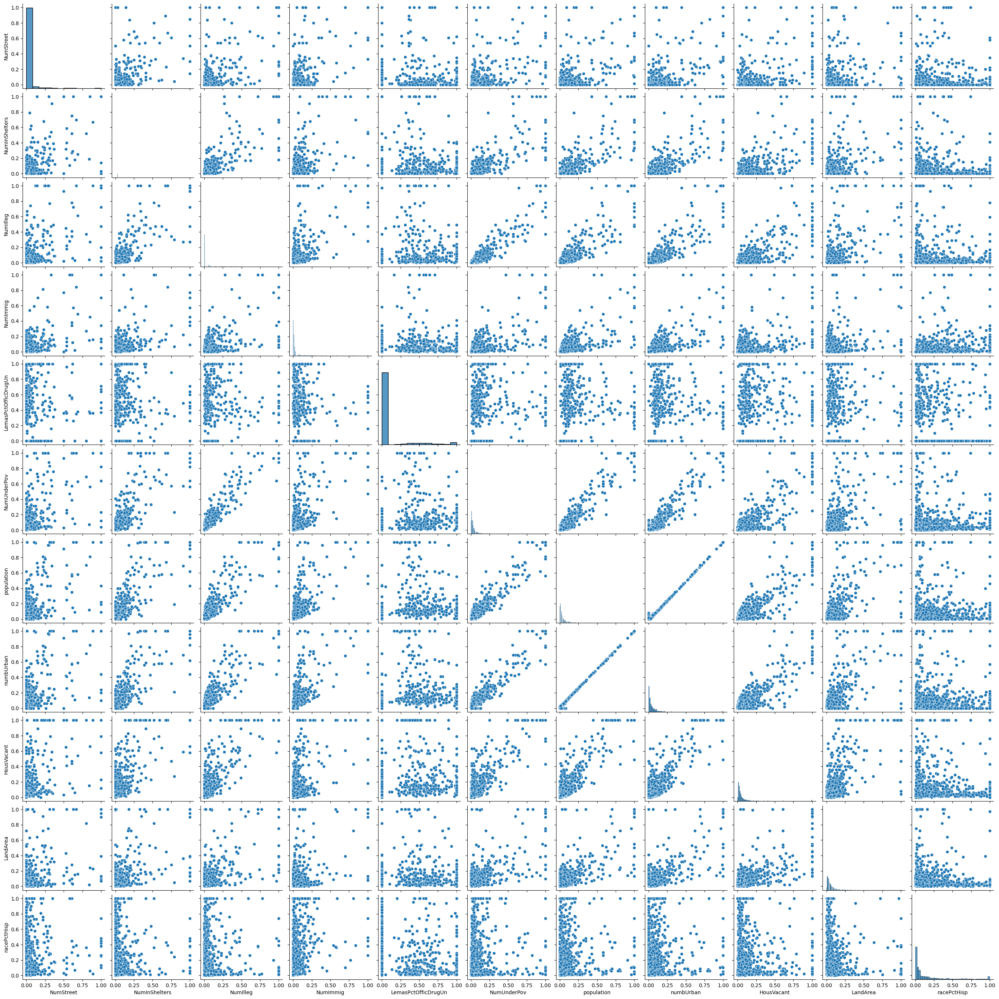

In [119]:
sns.pairplot(top_cols_communities_data)

It can be observed that population and numbUrban are linearly correlated.

It is not possible to determine the siginificance of the features just by looking at the scatter plots. Scatter plots just help us to see the correlation between features.

<AxesSubplot: >

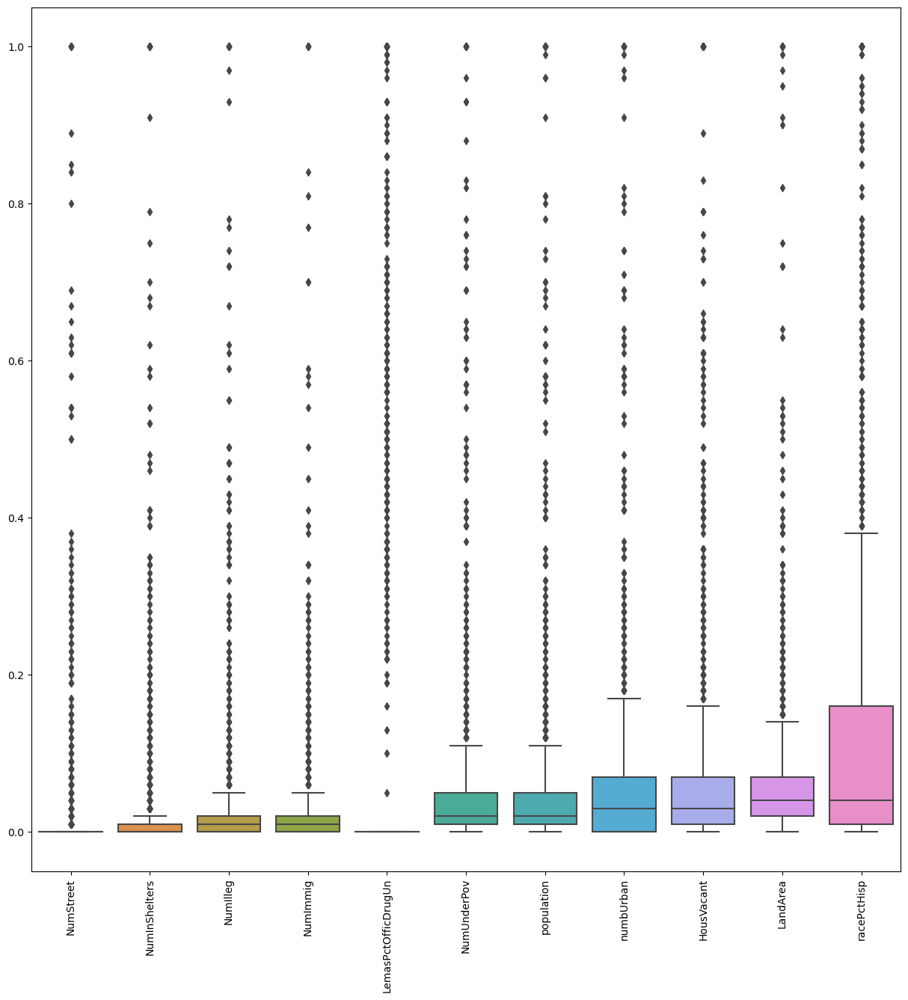

In [120]:
plt.figure(figsize=(15,15))
plt.xticks(rotation=90)
sns.boxplot(data = top_cols_communities_data)

### (f) Fit a linear model

In [121]:
communities_data_train_Y = communities_data_train['ViolentCrimesPerPop']
communities_data_train_X = communities_data_train.drop('ViolentCrimesPerPop',axis=1)
communities_data_test_Y = communities_data_test['ViolentCrimesPerPop']
communities_data_test_X = communities_data_test.drop('ViolentCrimesPerPop',axis=1)

In [122]:
l_reg = LinearRegression().fit(communities_data_train_X, communities_data_train_Y)
y_predict = l_reg.predict(communities_data_test_X)
mse = mean_squared_error(communities_data_test_Y, y_predict)
print('The test error for linear model is:', mse)

The test error for linear model is: 0.018278350475800554


### (g) Fit a ridge regression model

In [123]:
n = [10**i for i in np.arange(-4, 4, 0.025).tolist()]
model_ridge = Ridge(random_state=0)
parameters = {'alpha':n}
grid_ridge = GridSearchCV(model_ridge, parameters)
grid_ridge.fit(communities_data_train_X, communities_data_train_Y)
best_alpha_index = np.argmax(grid_ridge.cv_results_['mean_test_score'])
best_alpha_ridge = grid_ridge.cv_results_['param_alpha'][best_alpha_index]
print("test_scores", grid_ridge.cv_results_['mean_test_score'][best_alpha_index])
print("Best alpha for Ridge Regression:", best_alpha_ridge)

test_scores 0.6543858000055884
Best alpha for Ridge Regression: 2.660725059798716


In [124]:
best_ridge =  Ridge(alpha= best_alpha_ridge,random_state=0)
best_ridge.fit(communities_data_test_X, communities_data_test_Y)
communities_data_test_predictors_ridge = best_ridge.predict(communities_data_test_X)
mse = mean_squared_error(communities_data_test_Y, communities_data_test_predictors_ridge)
print('The test error for Ridge Regression is:', mse)

The test error for Ridge Regression is: 0.01400061522412214


### (h) Fit a LASSO model

In [125]:
lasso_regression = LassoCV(max_iter=1500)
lasso_regression.fit(communities_data_train_X,communities_data_train_Y)
y_pred = lasso_regression.predict(communities_data_test_X)
best_alpha = lasso_regression.alpha_
print('Best alpha for Lasso:', best_alpha)
print('The test error for Lasso Regression is:',mean_squared_error(communities_data_test_Y,y_pred))

Best alpha for Lasso: 0.00014260430059695207
The test error for Lasso Regression is: 0.01771137833848656


In [126]:
print('Features Chosen:')
features = communities_data_train_X.iloc[:,:-1]
print('------------------')
for i in range(0,len(features.columns)):
    if lasso_regression.coef_[i]!=0:
        print(features.columns[i])

Features Chosen:
------------------
population
racepctblack
racePctAsian
agePct12t21
agePct12t29
pctUrban
pctWWage
pctWFarmSelf
pctWInvInc
pctWSocSec
pctWPubAsst
pctWRetire
whitePerCap
blackPerCap
indianPerCap
AsianPerCap
OtherPerCap
HispPerCap
PctPopUnderPov
PctLess9thGrade
PctEmploy
PctEmplManu
PctOccupManu
MalePctDivorce
MalePctNevMarr
FemalePctDiv
PctKids2Par
PctYoungKids2Par
PctTeen2Par
PctWorkMom
PctIlleg
NumImmig
PctImmigRec5
PctImmigRec10
PctRecImmig10
PctNotSpeakEnglWell
PctLargHouseOccup
PersPerOccupHous
PctPersOwnOccup
PctPersDenseHous
PctHousLess3BR
HousVacant
PctHousOccup
PctVacantBoarded
PctVacMore6Mos
MedYrHousBuilt
PctHousNoPhone
PctWOFullPlumb
OwnOccLowQuart
RentLowQ
MedRent
MedRentPctHousInc
MedOwnCostPctInc
MedOwnCostPctIncNoMtg
NumStreet
PctForeignBorn
PctBornSameState
PctSameCity85
LemasSwFTFieldPerPop
PolicReqPerOffic
PctPolicBlack
PctPolicHisp
OfficAssgnDrugUnits
NumKindsDrugsSeiz
PolicAveOTWorked
LandArea
PopDens
PctUsePubTrans
LemasPctPolicOnPatr
LemasGangUnitD

After Standardizing the data:-

In [127]:
lasso_regression = LassoCV(max_iter=1500)
standard_scaler = StandardScaler()

lasso_regression.fit(standard_scaler.fit_transform(communities_data_train_X),communities_data_train_Y)
y_pred = lasso_regression.predict(standard_scaler.transform(communities_data_test_X))
best_alpha = lasso_regression.alpha_
mse = mean_squared_error(communities_data_test_Y,y_pred)
print('Best alpha for Lasso after standardizing:',best_alpha)
print('The test error for Lasso Regression after standardizing data is:', mse)

Best alpha for Lasso after standardizing: 0.0007577864224987347
The test error for Lasso Regression after standardizing data is: 0.01786130900279466


In [128]:
print('Features Chosen:')
features = communities_data_train_X.iloc[:,:-1]
print('------------------')
for i in range(0,len(features.columns)):
    if lasso_regression.coef_[i]!=0:
        print(features.columns[i])

Features Chosen:
------------------
population
racepctblack
agePct12t21
agePct12t29
pctUrban
pctWWage
pctWFarmSelf
pctWInvInc
pctWSocSec
pctWPubAsst
pctWRetire
whitePerCap
blackPerCap
indianPerCap
AsianPerCap
OtherPerCap
HispPerCap
PctPopUnderPov
PctEmploy
PctEmplManu
MalePctDivorce
MalePctNevMarr
FemalePctDiv
PctKids2Par
PctYoungKids2Par
PctTeen2Par
PctWorkMom
PctIlleg
NumImmig
PctImmigRec5
PctImmigRec10
PctRecImmig10
PctNotSpeakEnglWell
PctLargHouseOccup
PersPerOccupHous
PersPerOwnOccHous
PctPersOwnOccup
PctPersDenseHous
PctHousLess3BR
HousVacant
PctHousOccup
PctVacantBoarded
PctVacMore6Mos
MedYrHousBuilt
PctHousNoPhone
PctWOFullPlumb
RentLowQ
MedRent
MedRentPctHousInc
MedOwnCostPctInc
MedOwnCostPctIncNoMtg
NumStreet
PctForeignBorn
PctSameCity85
LemasSwFTFieldPerPop
LemasTotalReq
PolicReqPerOffic
RacialMatchCommPol
PctPolicBlack
PctPolicHisp
OfficAssgnDrugUnits
NumKindsDrugsSeiz
PolicAveOTWorked
LandArea
PopDens
PctUsePubTrans
PolicCars
LemasPctPolicOnPatr
LemasGangUnitDeploy


The test error for normalized data is 0.0177 while that for standardized data is 0.0178, showing that Lasso Regression performs slightly worse when the data is standardized as compared to when it is normalized.

### (i) Fit a PCR model

In [129]:
pcr_pipe = Pipeline([('scaler', StandardScaler()), ('pca', PCA() ), ('linear_regression', LinearRegression())])
parameters = {'pca__n_components':np.arange(1,123,1)}

In [130]:
grid_pcr = GridSearchCV(pcr_pipe, parameters, scoring = 'neg_mean_squared_error')
grid_pcr.fit(communities_data_train_X, communities_data_train_Y)

GridSearchCV(estimator=Pipeline(steps=[('scaler', StandardScaler()),
                                       ('pca', PCA()),
                                       ('linear_regression',
                                        LinearRegression())]),
             param_grid={'pca__n_components': array([  1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,  13,
        14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122])},
             scoring='n

In [131]:
print(grid_pcr.best_estimator_)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=95)),
                ('linear_regression', LinearRegression())])


In [132]:
grid_pcr.best_estimator_.fit(communities_data_train_X,communities_data_train_Y)

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=95)),
                ('linear_regression', LinearRegression())])

As can be seen, the value of M(n components) is: 95.

In [133]:
communities_data_test_predictors_pca = grid_pcr.predict(communities_data_test_X)
mse = mean_squared_error(communities_data_test_Y, communities_data_test_predictors_pca)
print('The test error for PCR Model is:', mse)

The test error for PCR Model is: 0.018463089728131807


### (j) Fit a boosting tree

In [134]:
train_matrix = xgb.DMatrix(data=communities_data_train_X,label=communities_data_train_Y)
params = {'objective':'reg:squarederror' }
alpha = [10**i for i in np.arange(-4, 4, 0.025).tolist()]
rmse_l1=[]
for a in alpha:
    params['alpha'] = a
    cv_results = xgb.cv(dtrain=train_matrix, params=params, nfold=5, metrics="rmse", seed=0)
    rmse_l1.append(cv_results['test-rmse-mean'].tail(1).values[0])
rmse_l1

[0.15296432087726708,
 0.15296424572694653,
 0.1529901630598365,
 0.1529900938543981,
 0.1529900213812529,
 0.1530504534497652,
 0.15305049341554453,
 0.15305040642548748,
 0.1533305845703034,
 0.15418016321513126,
 0.15418005755894243,
 0.15417994472338944,
 0.15417982385140436,
 0.15417969866820622,
 0.154179563664214,
 0.15417942101242393,
 0.1541792693010931,
 0.15417910841188426,
 0.1541789368013499,
 0.15417875623406335,
 0.15417856273396552,
 0.15417836308509153,
 0.15343082950861425,
 0.1534306345285462,
 0.15343042652364564,
 0.1534302041774635,
 0.1534299732236097,
 0.15342972655190487,
 0.15342946583451691,
 0.15328456466373783,
 0.1530878337992682,
 0.15308745054863498,
 0.15308704167300477,
 0.15348953870139465,
 0.1534836651930934,
 0.15348280900854316,
 0.15348226429200545,
 0.15349370556046674,
 0.15349309329220082,
 0.15349244507022264,
 0.1535195909805348,
 0.153204683552572,
 0.15319802502173532,
 0.15329601269091506,
 0.15329518307938356,
 0.15329429394280256,
 0.15

In [135]:
best_alpha=np.argmin(rmse_l1)
print("Best l1 alpha =", alpha[best_alpha])

Best l1 alpha = 0.0891250938133724


In [136]:
test_matrix = xgb.DMatrix(data=communities_data_test_X,label=communities_data_test_Y)

In [137]:
params = {'objective':'reg:squarederror', 'alpha':best_alpha}
mod = xgb.train(params=params,dtrain=train_matrix)

In [138]:
communities_data_test_predictors_xgb = mod.predict(test_matrix)
mean_squared_error(communities_data_test_Y, communities_data_test_predictors_xgb)

0.033060351783703625

#### Citations:

1.https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.LabelEncoder.html
<br>
2.https://towardsdatascience.com/visualizing-decision-trees-with-python-scikit-learn-graphviz-matplotlib-1c50b4aa68dc
<br>
3.https://mljar.com/blog/extract-rules-decision-tree/
<br>
4.https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html
<br>
5.https://scikit-learn.org/stable/auto_examples/tree/plot_cost_complexity_pruning.html
<br>
6.https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html
<br>
7.https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.fillna.html
<br>
8.https://www.geeksforgeeks.org/plotting-correlation-matrix-using-python/
<br>
9.https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.PCA.html#sklearn.decomposition.PCA
<br>
10.https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html